In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import seaborn as sns
import pandas as pd
from pathlib import Path
from scipy.interpolate import UnivariateSpline
from scipy.stats import mode

from math import isnan

import gc 
import sys
sys.path.append('../src')
from bossa.utils import sample_histogram
from bossa.sampling import RandomSampling
from bossa.imf import IGIMF
from bossa.constants import DATA_PATH

In [2]:
plt.style.use('./plotstyle.mplstyle')
FIGURE_FOLDER = Path('./figures')

In [3]:
cm_cubehelix = sns.cubehelix_palette(as_cmap=True)

In [4]:
IGIMF_ZAMS_DIR_PATH = Path(DATA_PATH, 'zams_grids')
ONLYBIN_SAMPLE_DIR_PATH = Path(IGIMF_ZAMS_DIR_PATH, '12x10_2222_zams_grid')
ALLMULT_SAMPLE_DIR_PATH = Path(IGIMF_ZAMS_DIR_PATH, '12x10_2212_zams_grid')
ONLYBIN_CANON_SAMPLE_DIR_PATH = Path(IGIMF_ZAMS_DIR_PATH, '12x10_1122_zams_grid')
ALLMULT_CANON_SAMPLE_DIR_PATH = Path(IGIMF_ZAMS_DIR_PATH, '12x10_1112_zams_grid')

In [7]:
onlybin_sample_paths = list(ONLYBIN_SAMPLE_DIR_PATH.glob('*.parquet'))
allmult_sample_paths = list(ALLMULT_SAMPLE_DIR_PATH.glob('*.parquet'))
onlybin_canon_sample_paths = list(ONLYBIN_CANON_SAMPLE_DIR_PATH.glob('*.parquet'))
allmult_canon_sample_paths = list(ALLMULT_CANON_SAMPLE_DIR_PATH.glob('*.parquet'))
#sample_paths = list(CO_DIR_PATH.glob('*.parquet'))

## Scatter matrix multiple samples

In [10]:
fulldf_cols = ['Mass_ZAMS1_Found', 'Mass_ZAMS2_Found', 'MassRatioFound_ZAMS', 'LogOrbitalPeriod_ZAMS', 'Eccentricity_ZAMS', 'CompanionNumber', 'SystemMass']

### Onlybin

In [11]:
full_df = pd.DataFrame(columns=fulldf_cols, dtype='float16')

In [12]:
sample_paths = onlybin_sample_paths

In [13]:
sample_paths_dict = {}
for path in sample_paths:
    z = float(path.name.split('_')[0].split('=')[1])
    if z not in sample_paths_dict:
        sample_paths_dict[z] = []
    sample_paths_dict[z].append(path)

In [14]:
row_i = 0
for z in sample_paths_dict:
    paths = sample_paths_dict[z]
    for path in paths:
        feh = float(path.name.split('_')[1].split('=')[1])
        try:
            df = pd.read_parquet(path, engine='pyarrow', columns=fulldf_cols, filters=[('CompanionNumber', '==', 1)])
        except:
            print(f'Could not load {path.name}. ({row_i+1}/{len(sample_paths)})')
            pass
        else:
            nrow = len(df)
            df['Redshift'] = np.array([z]*len(df))
            df['[Fe/H]'] = np.array([feh]*len(df))
            full_df = pd.concat((full_df,df))
            del df
            gc.collect()
            print(f'Added {nrow} rows from {path.name}. Total: {len(full_df):.2e} rows. ({row_i+1}/{len(sample_paths)})')
        finally:
            row_i += 1

Added 859712 rows from z=3.052_feh=-0.528_logsfr=1.408_1e4ZOH=85658_1e2Mgal=1058_1e2logn=-361_logpool=6.60_igimf_zams_sample.parquet. Total: 8.60e+05 rows. (1/120)
Added 807932 rows from z=3.052_feh=-2.760_logsfr=-0.980_1e4ZOH=65702_1e2Mgal=679_1e2logn=-146_logpool=6.60_igimf_zams_sample.parquet. Total: 1.67e+06 rows. (2/120)
Added 853008 rows from z=3.052_feh=-0.671_logsfr=1.268_1e4ZOH=84945_1e2Mgal=1036_1e2logn=-342_logpool=6.60_igimf_zams_sample.parquet. Total: 2.52e+06 rows. (3/120)
Added 833657 rows from z=3.052_feh=-1.209_logsfr=0.724_1e4ZOH=81210_1e2Mgal=948_1e2logn=-278_logpool=6.60_igimf_zams_sample.parquet. Total: 3.35e+06 rows. (4/120)
Added 866513 rows from z=3.052_feh=-0.410_logsfr=1.543_1e4ZOH=86251_1e2Mgal=1079_1e2logn=-383_logpool=6.60_igimf_zams_sample.parquet. Total: 4.22e+06 rows. (5/120)
Added 874538 rows from z=3.052_feh=-0.304_logsfr=1.688_1e4ZOH=86777_1e2Mgal=1102_1e2logn=-411_logpool=6.60_igimf_zams_sample.parquet. Total: 5.10e+06 rows. (6/120)


Added 846334 rows from z=3.052_feh=-0.851_logsfr=1.116_1e4ZOH=84046_1e2Mgal=1011_1e2logn=-323_logpool=6.60_igimf_zams_sample.parquet. Total: 5.94e+06 rows. (7/120)
Added 840088 rows from z=3.052_feh=-1.044_logsfr=0.943_1e4ZOH=82860_1e2Mgal=983_1e2logn=-302_logpool=6.60_igimf_zams_sample.parquet. Total: 6.78e+06 rows. (8/120)
Added 825465 rows from z=3.052_feh=-1.461_logsfr=0.418_1e4ZOH=78685_1e2Mgal=900_1e2logn=-246_logpool=6.60_igimf_zams_sample.parquet. Total: 7.61e+06 rows. (9/120)
Added 886477 rows from z=3.052_feh=-0.195_logsfr=1.884_1e4ZOH=87326_1e2Mgal=1132_1e2logn=-464_logpool=6.60_igimf_zams_sample.parquet. Total: 8.49e+06 rows. (10/120)
Added 863133 rows from z=2.090_feh=0.058_logsfr=1.476_1e4ZOH=88590_1e2Mgal=1084_1e2logn=-337_logpool=6.60_igimf_zams_sample.parquet. Total: 9.36e+06 rows. (11/120)
Added 877798 rows from z=2.090_feh=0.203_logsfr=1.733_1e4ZOH=89314_1e2Mgal=1125_1e2logn=-410_logpool=6.60_igimf_zams_sample.parquet. Total: 1.02e+07 rows. (12/120)
Added 830306 rows

In [15]:
rename_dict = {'Mass_ZAMS1_Found': r'$m_1$',
              'Mass_ZAMS2_Found': r'$m_2$',
              'MassRatioFound_ZAMS': r'$q$',
              'LogOrbitalPeriod_ZAMS': r'$\log P$',
              'Eccentricity_ZAMS': r'$e$',
              'CompanionNumber': r'$n_\mathrm{cp}$',
              'SystemMass': 'm_\mathrm{sys}'}

<>:7: SyntaxWarning: invalid escape sequence '\m'
<>:7: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipykernel_640800/3809610683.py:7: SyntaxWarning: invalid escape sequence '\m'
  'SystemMass': 'm_\mathrm{sys}'}


In [16]:
full_df.rename(columns=rename_dict, inplace=True)

In [17]:
full_df[r'$\log m_1$'] = np.log10(full_df[r'$m_1$'])
full_df[r'$\log m_2$'] = np.log10(full_df[r'$m_2$'])

In [18]:
onlybin_df = full_df.copy()

In [19]:
onlybin_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Index: 100836355 entries, 0 to 867725
Data columns (total 11 columns):
 #   Column           Dtype  
---  ------           -----  
 0   $m_1$            float32
 1   $m_2$            float32
 2   $q$              float32
 3   $\log P$         float32
 4   $e$              float32
 5   $n_\mathrm{cp}$  float32
 6   m_\mathrm{sys}   float32
 7   Redshift         float64
 8   [Fe/H]           float64
 9   $\log m_1$       float32
 10  $\log m_2$       float32
dtypes: float32(9), float64(2)
memory usage: 5.6 GB


In [20]:
onlybin_df['[Fe/H]'] = onlybin_df['[Fe/H]'].astype('float32')

In [21]:
onlybin_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Index: 100836355 entries, 0 to 867725
Data columns (total 11 columns):
 #   Column           Dtype  
---  ------           -----  
 0   $m_1$            float32
 1   $m_2$            float32
 2   $q$              float32
 3   $\log P$         float32
 4   $e$              float32
 5   $n_\mathrm{cp}$  float32
 6   m_\mathrm{sys}   float32
 7   Redshift         float64
 8   [Fe/H]           float32
 9   $\log m_1$       float32
 10  $\log m_2$       float32
dtypes: float32(10), float64(1)
memory usage: 5.3 GB


In [22]:
del full_df
gc.collect()

0

### Allmult

In [23]:
full_df = pd.DataFrame(columns=fulldf_cols, dtype='float16')

In [24]:
sample_paths = allmult_sample_paths

In [25]:
sample_paths_dict = {}
for path in sample_paths:
    z = float(path.name.split('_')[0].split('=')[1])
    if z not in sample_paths_dict:
        sample_paths_dict[z] = []
    sample_paths_dict[z].append(path)

In [26]:
row_i = 0
for z in sample_paths_dict:
    paths = sample_paths_dict[z]
    for path in paths:
        feh = float(path.name.split('_')[1].split('=')[1])
        try:
            df = pd.read_parquet(path, engine='pyarrow', columns=fulldf_cols, filters=[('CompanionNumber', '!=', 0)])
        except:
            print(f'Could not load {path.name}. ({row_i+1}/{len(sample_paths)})')
            pass
        else:
            nrow = len(df)
            df['Redshift'] = np.array([z]*len(df))
            df['[Fe/H]'] = np.array([feh]*len(df))
            full_df = pd.concat((full_df,df))
            del df
            gc.collect()
            print(f'Added {nrow} rows from {path.name}. Total: {len(full_df):.2e} rows. ({row_i+1}/{len(sample_paths)})')
        finally:
            row_i += 1

Added 643895 rows from z=3.052_feh=-0.528_logsfr=1.408_1e4ZOH=85658_1e2Mgal=1058_1e2logn=-361_logpool=6.60_igimf_zams_sample.parquet. Total: 6.44e+05 rows. (1/120)
Added 700253 rows from z=3.052_feh=-2.760_logsfr=-0.980_1e4ZOH=65702_1e2Mgal=679_1e2logn=-146_logpool=6.60_igimf_zams_sample.parquet. Total: 1.34e+06 rows. (2/120)
Added 653050 rows from z=3.052_feh=-0.671_logsfr=1.268_1e4ZOH=84945_1e2Mgal=1036_1e2logn=-342_logpool=6.60_igimf_zams_sample.parquet. Total: 2.00e+06 rows. (3/120)
Added 672992 rows from z=3.052_feh=-1.209_logsfr=0.724_1e4ZOH=81210_1e2Mgal=948_1e2logn=-278_logpool=6.60_igimf_zams_sample.parquet. Total: 2.67e+06 rows. (4/120)
Added 636260 rows from z=3.052_feh=-0.410_logsfr=1.543_1e4ZOH=86251_1e2Mgal=1079_1e2logn=-383_logpool=6.60_igimf_zams_sample.parquet. Total: 3.31e+06 rows. (5/120)


Added 630026 rows from z=3.052_feh=-0.304_logsfr=1.688_1e4ZOH=86777_1e2Mgal=1102_1e2logn=-411_logpool=6.60_igimf_zams_sample.parquet. Total: 3.94e+06 rows. (6/120)
Added 658879 rows from z=3.052_feh=-0.851_logsfr=1.116_1e4ZOH=84046_1e2Mgal=1011_1e2logn=-323_logpool=6.60_igimf_zams_sample.parquet. Total: 4.60e+06 rows. (7/120)
Added 666050 rows from z=3.052_feh=-1.044_logsfr=0.943_1e4ZOH=82860_1e2Mgal=983_1e2logn=-302_logpool=6.60_igimf_zams_sample.parquet. Total: 5.26e+06 rows. (8/120)
Added 682046 rows from z=3.052_feh=-1.461_logsfr=0.418_1e4ZOH=78685_1e2Mgal=900_1e2logn=-246_logpool=6.60_igimf_zams_sample.parquet. Total: 5.94e+06 rows. (9/120)
Added 617764 rows from z=3.052_feh=-0.195_logsfr=1.884_1e4ZOH=87326_1e2Mgal=1132_1e2logn=-464_logpool=6.60_igimf_zams_sample.parquet. Total: 6.56e+06 rows. (10/120)
Added 641006 rows from z=2.090_feh=0.058_logsfr=1.476_1e4ZOH=88590_1e2Mgal=1084_1e2logn=-337_logpool=6.60_igimf_zams_sample.parquet. Total: 7.20e+06 rows. (11/120)
Added 626189 rows

In [27]:
full_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Index: 79838378 entries, 0 to 636855
Data columns (total 9 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Mass_ZAMS1_Found       float32
 1   Mass_ZAMS2_Found       float32
 2   MassRatioFound_ZAMS    float32
 3   LogOrbitalPeriod_ZAMS  float32
 4   Eccentricity_ZAMS      float32
 5   CompanionNumber        float32
 6   SystemMass             float32
 7   Redshift               float64
 8   [Fe/H]                 float64
dtypes: float32(7), float64(2)
memory usage: 3.9 GB


In [28]:
#full_df.Redshift = full_df.Redshift.astype('category')
full_df['[Fe/H]'] = full_df['[Fe/H]'].astype('float32')

In [25]:
full_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79791473 entries, 0 to 637277
Data columns (total 9 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Mass_ZAMS1_Found       float32
 1   Mass_ZAMS2_Found       float32
 2   MassRatioFound_ZAMS    float32
 3   LogOrbitalPeriod_ZAMS  float32
 4   Eccentricity_ZAMS      float32
 5   CompanionNumber        float32
 6   SystemMass             float32
 7   Redshift               float64
 8   [Fe/H]                 float32
dtypes: float32(8), float64(1)
memory usage: 3.6 GB


In [26]:
rename_dict = {'Mass_ZAMS1_Found': r'$m_1$',
              'Mass_ZAMS2_Found': r'$m_2$',
              'MassRatioFound_ZAMS': r'$q$',
              'LogOrbitalPeriod_ZAMS': r'$\log P$',
              'Eccentricity_ZAMS': r'$e$',
              'CompanionNumber': r'$n_\mathrm{cp}$',
              'SystemMass': 'm_\mathrm{sys}'}

In [27]:
full_df.rename(columns=rename_dict, inplace=True)

In [28]:
full_df[r'$\log m_1$'] = np.log10(full_df[r'$m_1$'])
full_df[r'$\log m_2$'] = np.log10(full_df[r'$m_2$'])

In [29]:
allmult_inner_df = full_df.copy()

In [30]:
del full_df
gc.collect()

0

## Kendall test

In [31]:
allmult_bin_df = allmult_inner_df[allmult_inner_df[r'$n_\mathrm{cp}$'] == 1].copy()
allmult_bin_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45110603 entries, 0 to 637277
Data columns (total 11 columns):
 #   Column           Dtype  
---  ------           -----  
 0   $m_1$            float32
 1   $m_2$            float32
 2   $q$              float32
 3   $\log P$         float32
 4   $e$              float32
 5   $n_\mathrm{cp}$  float32
 6   m_\mathrm{sys}   float32
 7   Redshift         float64
 8   [Fe/H]           float32
 9   $\log m_1$       float32
 10  $\log m_2$       float32
dtypes: float32(10), float64(1)
memory usage: 2.4 GB


In [32]:
allmult_bin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45110603 entries, 0 to 637277
Data columns (total 11 columns):
 #   Column           Dtype  
---  ------           -----  
 0   $m_1$            float32
 1   $m_2$            float32
 2   $q$              float32
 3   $\log P$         float32
 4   $e$              float32
 5   $n_\mathrm{cp}$  float32
 6   m_\mathrm{sys}   float32
 7   Redshift         float64
 8   [Fe/H]           float32
 9   $\log m_1$       float32
 10  $\log m_2$       float32
dtypes: float32(10), float64(1)
memory usage: 2.4 GB


In [33]:
memus = onlybin_df.memory_usage(deep=True).sum()+allmult_inner_df.memory_usage(deep=True).sum()+allmult_bin_df.memory_usage(deep=True).sum()
print(f'Total dataframe memory usage: {(memus/1024**3):.2f} GB')

Total dataframe memory usage: 11.77 GB


In [34]:
heat_matrix_cols = [r'$\log m_1$',
                    r'$\log m_2$',
                    r'$q$', 
                    r'$\log P$',
                    r'$e$', 
                    r'$n_\mathrm{cp}$',
                    '[Fe/H]', 
                    'Redshift']

ob_heat_matrix_cols = [r'$\log m_1$',
                    r'$\log m_2$',
                    r'$q$', 
                    r'$\log P$',
                    r'$e$', 
                    '[Fe/H]', 
                    'Redshift']

In [35]:
allmult_inner_df = allmult_inner_df[heat_matrix_cols]
allmult_bin_df = allmult_bin_df[heat_matrix_cols]
onlybin_df = onlybin_df[heat_matrix_cols]

In [36]:
allmult_bin_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45110603 entries, 0 to 637277
Data columns (total 8 columns):
 #   Column           Dtype  
---  ------           -----  
 0   $\log m_1$       float32
 1   $\log m_2$       float32
 2   $q$              float32
 3   $\log P$         float32
 4   $e$              float32
 5   $n_\mathrm{cp}$  float32
 6   [Fe/H]           float32
 7   Redshift         float64
dtypes: float32(7), float64(1)
memory usage: 1.8 GB


In [37]:
inbin_kendall_matrix = allmult_inner_df.corr(method='kendall')
bin_kendall_matrix = allmult_bin_df.corr(method='kendall')
onlybin_kendall_matrix = onlybin_df.corr(method='kendall')

/home/lucasmdesa/anaconda3/envs/bco/lib/python3.9/site-packages/scipy/stats/stats.py:4812: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


In [41]:
columns = list(inbin_kendall_matrix.columns)

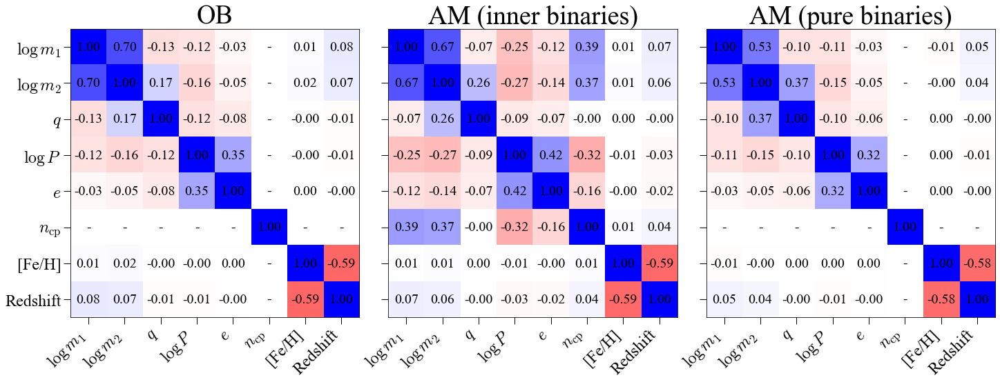

In [44]:
fig, axes = plt.subplots(1, 3, figsize=(24,18), sharex=True, sharey=True)
kendall_axes = axes
fig.subplots_adjust(hspace=-0.1, wspace=0.1)
rect = fig.patch
rect.set_facecolor('white')

kendall_axes[0].matshow(onlybin_kendall_matrix, cmap=cm.bwr_r, vmin=-1, vmax=1)
kendall_axes[1].matshow(inbin_kendall_matrix, cmap=cm.bwr_r, vmin=-1, vmax=1)
kendall_axes[2].matshow(bin_kendall_matrix, cmap=cm.bwr_r, vmin=-1, vmax=1)


for x in range(len(heat_matrix_cols)):
    for y in range(len(heat_matrix_cols)):        
        corr = onlybin_kendall_matrix.iloc[x,y]
        if isnan(corr):
            corr = '-'
        else:
            corr = f'{corr:.2f}'
        kendall_axes[0].text(x, y, corr, ha='center', va='center', fontsize=20)
        corr = inbin_kendall_matrix.iloc[x,y]
        if isnan(corr):
            corr = '-'
        else:
            corr = f'{corr:.2f}'
        kendall_axes[1].text(x, y, corr, ha='center', va='center', fontsize=20)
        corr = bin_kendall_matrix.iloc[x,y]
        if isnan(corr):
            corr = '-'
        else:
            corr = f'{corr:.2f}'
        kendall_axes[2].text(x, y, corr, ha='center', va='center', fontsize=20)
        
for ax in kendall_axes:
    ax.set_xticks(np.arange(0, len(columns), 1))
    ax.set_xticklabels(columns, rotation=45, ha='right')
    ax.tick_params(axis='x', labelbottom=True, labeltop=False, top=False)
    ax.set_yticks(np.arange(0, len(columns), 1))
    ax.set_yticklabels(columns)
    
for ax in axes.flatten():
    ax.tick_params(axis='x', top=False)

kendall_axes[0].text(0.5, 1, 'OB', ha='center', va='bottom', fontsize=38, transform=kendall_axes[0].transAxes)
kendall_axes[1].text(0.5, 1, 'AM (inner binaries)', ha='center', va='bottom', fontsize=38, transform=kendall_axes[1].transAxes)
kendall_axes[2].text(0.5, 1, 'AM (pure binaries)', ha='center', va='bottom', fontsize=38, transform=kendall_axes[2].transAxes)

plt.savefig(FIGURE_FOLDER/f'zams_kendall_matrices_1e8.pdf', bbox_inches='tight')
plt.savefig(FIGURE_FOLDER/f'zams_kendall_matrices_1e8.png', bbox_inches='tight')

## OLD

In [65]:
full_corr_matrix = full_df.corr()

In [66]:
columns = list(full_corr_matrix.columns)

[Text(0, 0, '$m_1\\,\\left(\\mathrm{M}_\\odot\\right)$'),
 Text(0, 1, '$m_2\\,\\left(\\mathrm{M}_\\odot\\right)$'),
 Text(0, 2, '$q$'),
 Text(0, 3, '$\\log\\left(P/\\mathrm{d}\\right)$'),
 Text(0, 4, '$e$'),
 Text(0, 5, '[Fe/H]'),
 Text(0, 6, 'Redshift')]

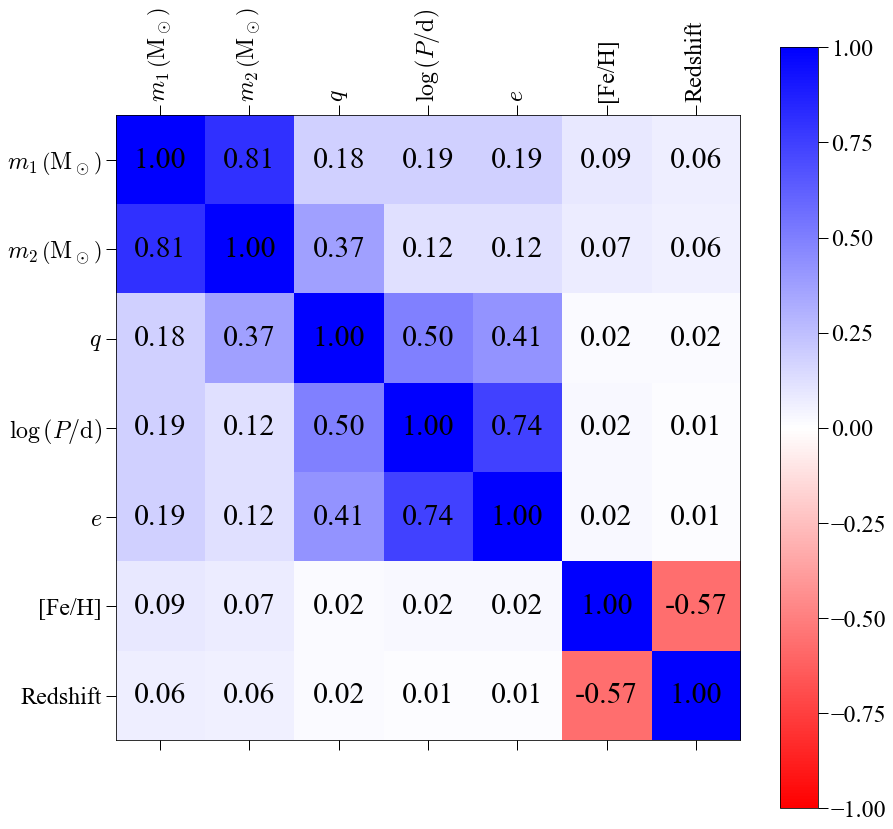

In [67]:
fig, ax = plt.subplots(figsize=(14,14))

plt.matshow(full_corr_matrix, fignum=0, cmap=cm.bwr_r, vmin=-1, vmax=1)
cb = plt.colorbar()

for x in np.arange(0, len(columns), 1):
    for y in np.arange(0, len(columns), 1):
        corr = full_corr_matrix.iloc[x,y]
        ax.text(x, y, f'{corr:.2f}', ha='center', va='center')

ax.set_xticks(np.arange(0, len(columns), 1))
ax.set_xticklabels(columns, rotation=90, ha='center')

ax.set_yticks(np.arange(0, len(columns), 1))
ax.set_yticklabels(columns)

## Kendall

In [68]:
full_corr_matrix_kendall = full_df.corr(method='kendall')

/home/lucasmdesa/anaconda3/envs/bco/lib/python3.9/site-packages/scipy/stats/stats.py:4812: RuntimeWarning: overflow encountered in long_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


[Text(0, 0, '$m_1\\,\\left(\\mathrm{M}_\\odot\\right)$'),
 Text(0, 1, '$m_2\\,\\left(\\mathrm{M}_\\odot\\right)$'),
 Text(0, 2, '$q$'),
 Text(0, 3, '$\\log\\left(P/\\mathrm{d}\\right)$'),
 Text(0, 4, '$e$'),
 Text(0, 5, '[Fe/H]'),
 Text(0, 6, 'Redshift')]

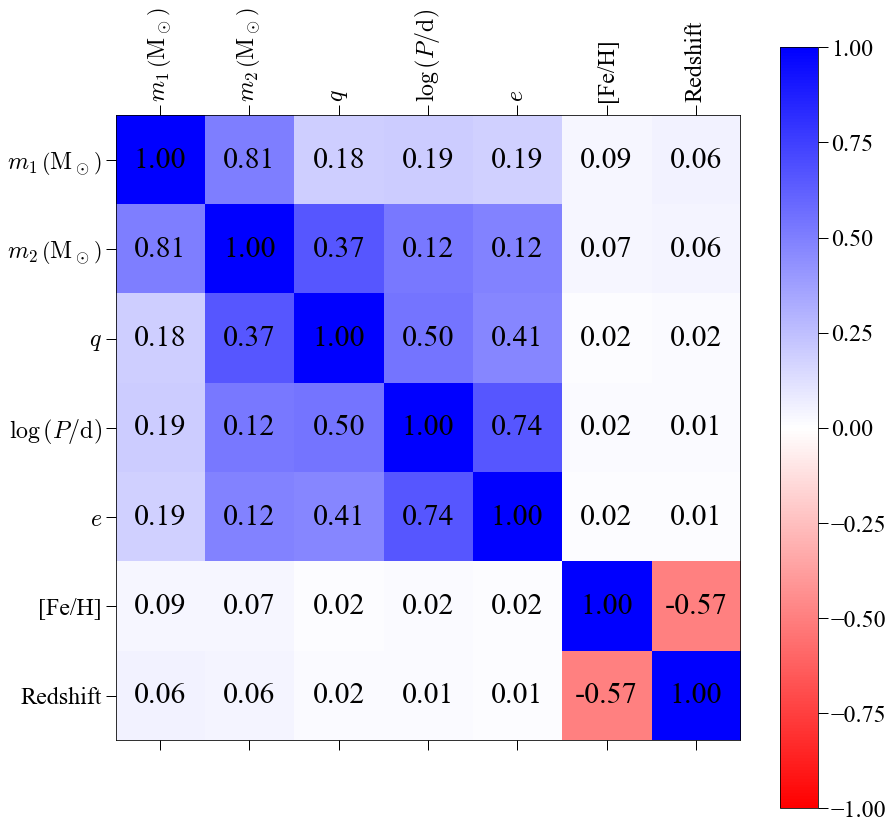

In [69]:
fig, ax = plt.subplots(figsize=(14,14))

plt.matshow(full_corr_matrix_kendall, fignum=0, cmap=cm.bwr_r, vmin=-1, vmax=1)
cb = plt.colorbar()

for x in np.arange(0, len(columns), 1):
    for y in np.arange(0, len(columns), 1):
        corr = full_corr_matrix.iloc[x,y]
        ax.text(x, y, f'{corr:.2f}', ha='center', va='center')

ax.set_xticks(np.arange(0, len(columns), 1))
ax.set_xticklabels(columns, rotation=90, ha='center')

ax.set_yticks(np.arange(0, len(columns), 1))
ax.set_yticklabels(columns)

## Spearman

## Heatmaps

In [11]:
fullmass = np.sum(full_df['SystemMass'])

In [14]:
full_df['LogMass_ZAMS1_Found'] = np.log10(full_df['Mass_ZAMS1_Found'])

In [15]:
full_df['LogMass_ZAMS2_Found'] = np.log10(full_df['Mass_ZAMS2_Found'])

/home/lucasmdesa/anaconda3/envs/bco/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [16]:
heat_matrix_cols = ['LogMass_ZAMS1_Found', 'LogMass_ZAMS2_Found', 'MassRatioFound_ZAMS', 'LogOrbitalPeriod_ZAMS', 'Eccentricity_ZAMS', '[Fe/H]']

In [17]:
full_df.reset_index(inplace=True, drop=True)

In [18]:
zs = full_df.Redshift.unique().to_numpy()
zs = zs[np.argsort(np.float32(zs))]

In [19]:
zs

array([0.496, 0.857, 1.101, 1.3  , 1.548, 1.798, 2.09 , 2.487, 3.052,
       4.644])

In [20]:
inner_binaries_df = full_df[full_df['CompanionNumber'] != 0]
inner_binaries_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 64374697 entries, 1 to 117159504
Data columns (total 11 columns):
 #   Column                 Dtype   
---  ------                 -----   
 0   Mass_ZAMS1_Found       float32 
 1   Mass_ZAMS2_Found       float32 
 2   MassRatioFound_ZAMS    float32 
 3   LogOrbitalPeriod_ZAMS  float32 
 4   Eccentricity_ZAMS      float32 
 5   CompanionNumber        float32 
 6   SystemMass             float32 
 7   Redshift               category
 8   [Fe/H]                 float64 
 9   LogMass_ZAMS1_Found    float32 
 10  LogMass_ZAMS2_Found    float32 
dtypes: category(1), float32(9), float64(1)
memory usage: 3.2 GB


In [21]:
binaries_df = inner_binaries_df[inner_binaries_df['CompanionNumber'] == 1]
binaries_df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36135400 entries, 1 to 117159503
Data columns (total 11 columns):
 #   Column                 Dtype   
---  ------                 -----   
 0   Mass_ZAMS1_Found       float32 
 1   Mass_ZAMS2_Found       float32 
 2   MassRatioFound_ZAMS    float32 
 3   LogOrbitalPeriod_ZAMS  float32 
 4   Eccentricity_ZAMS      float32 
 5   CompanionNumber        float32 
 6   SystemMass             float32 
 7   Redshift               category
 8   [Fe/H]                 float64 
 9   LogMass_ZAMS1_Found    float32 
 10  LogMass_ZAMS2_Found    float32 
dtypes: category(1), float32(9), float64(1)
memory usage: 1.8 GB


In [22]:
import gc
gc.collect()

0

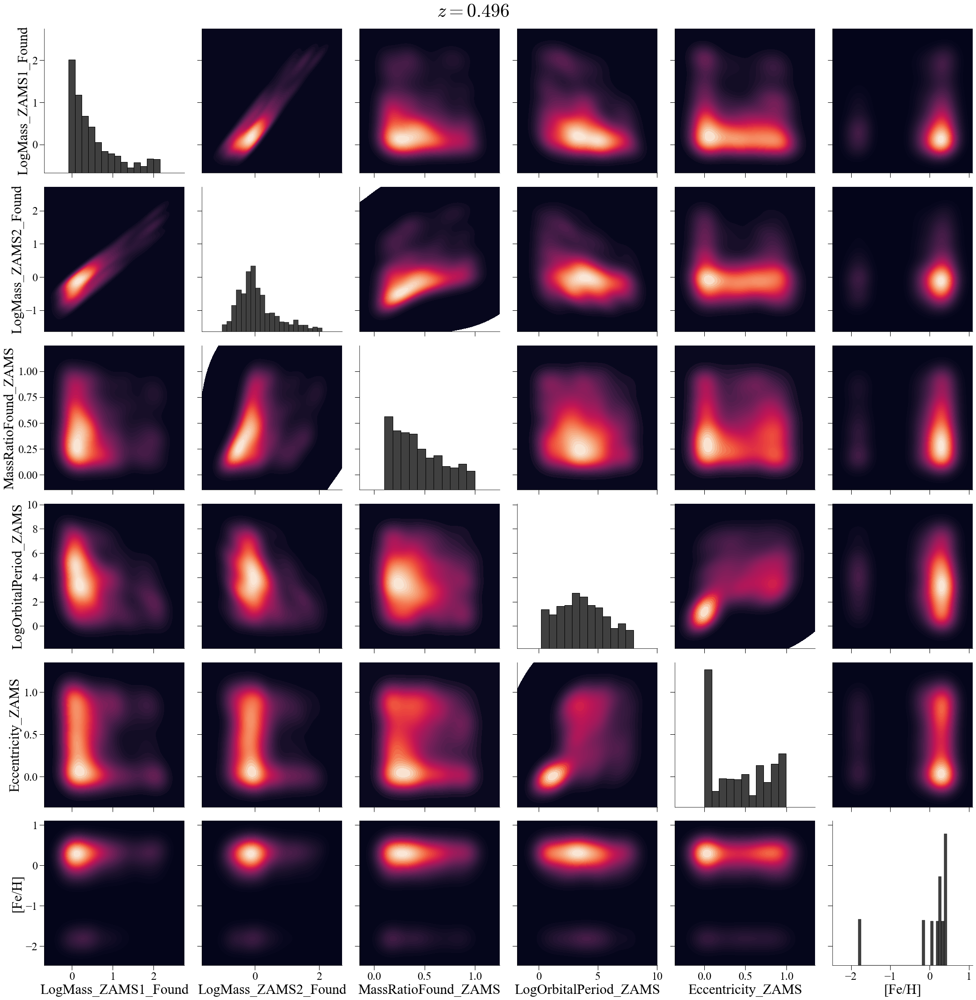

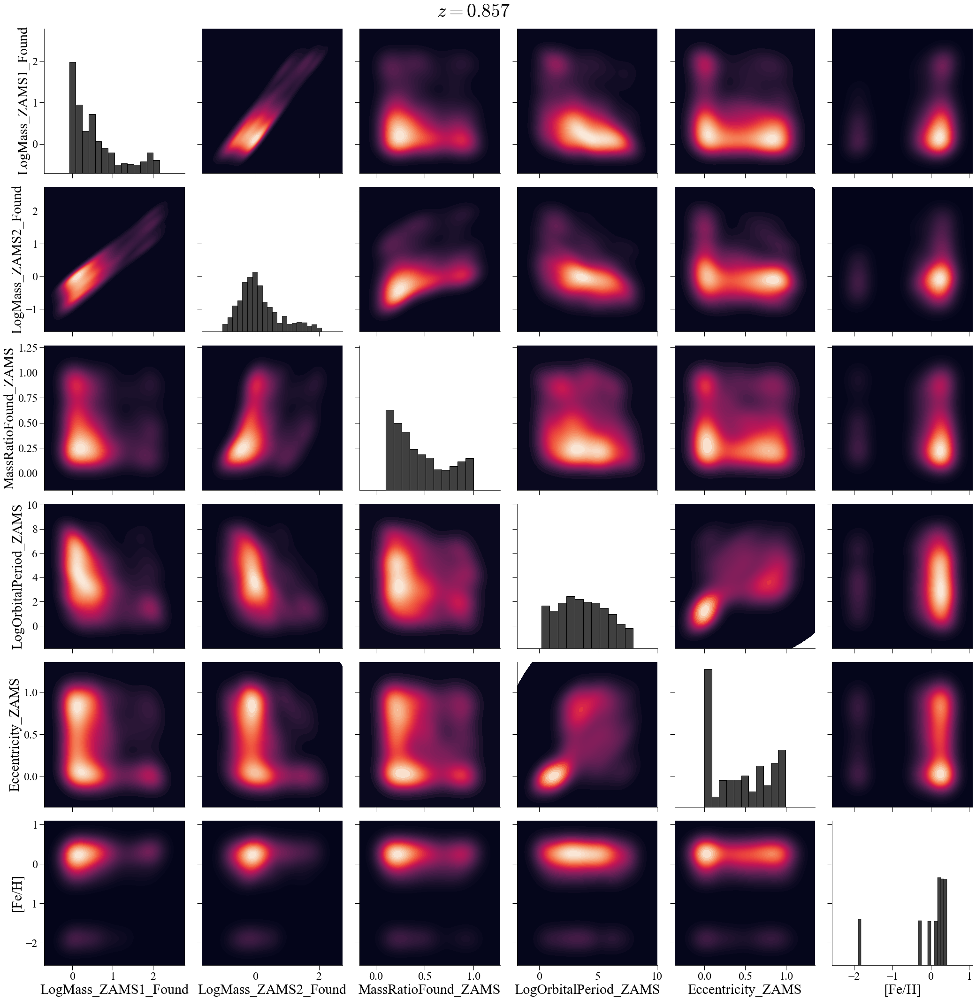

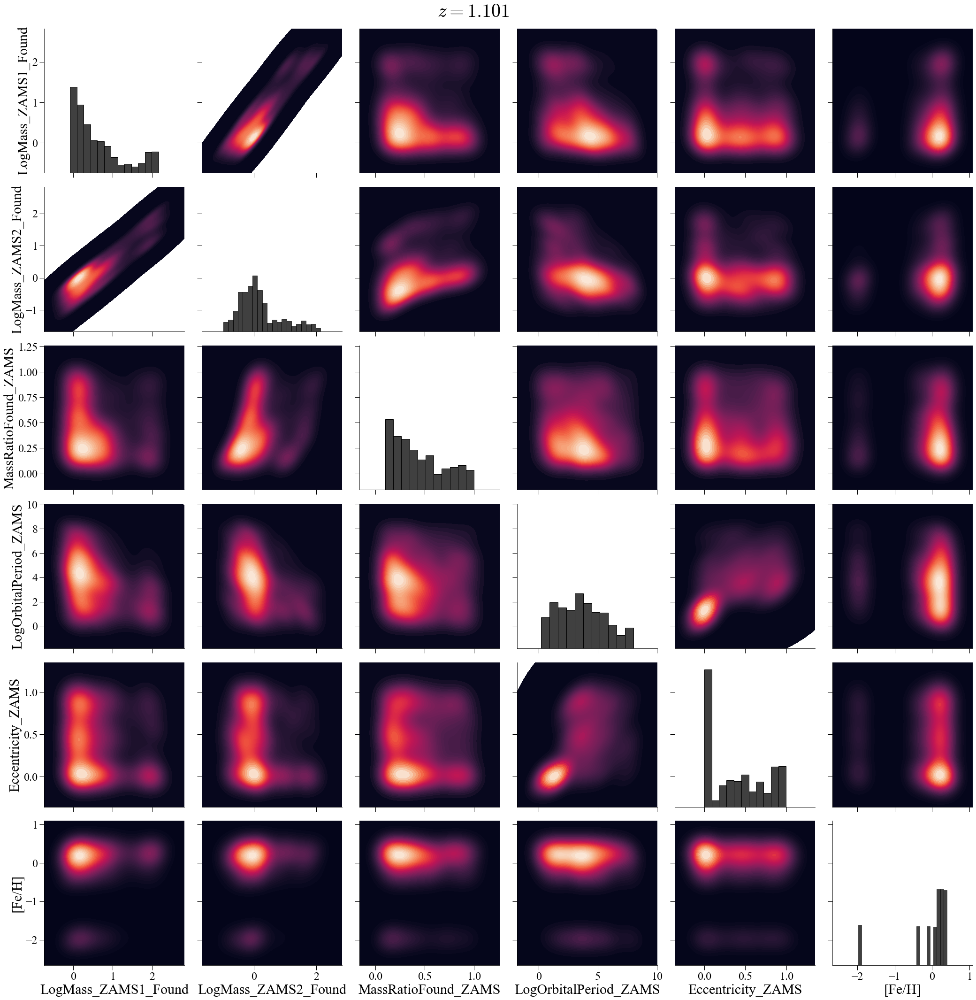

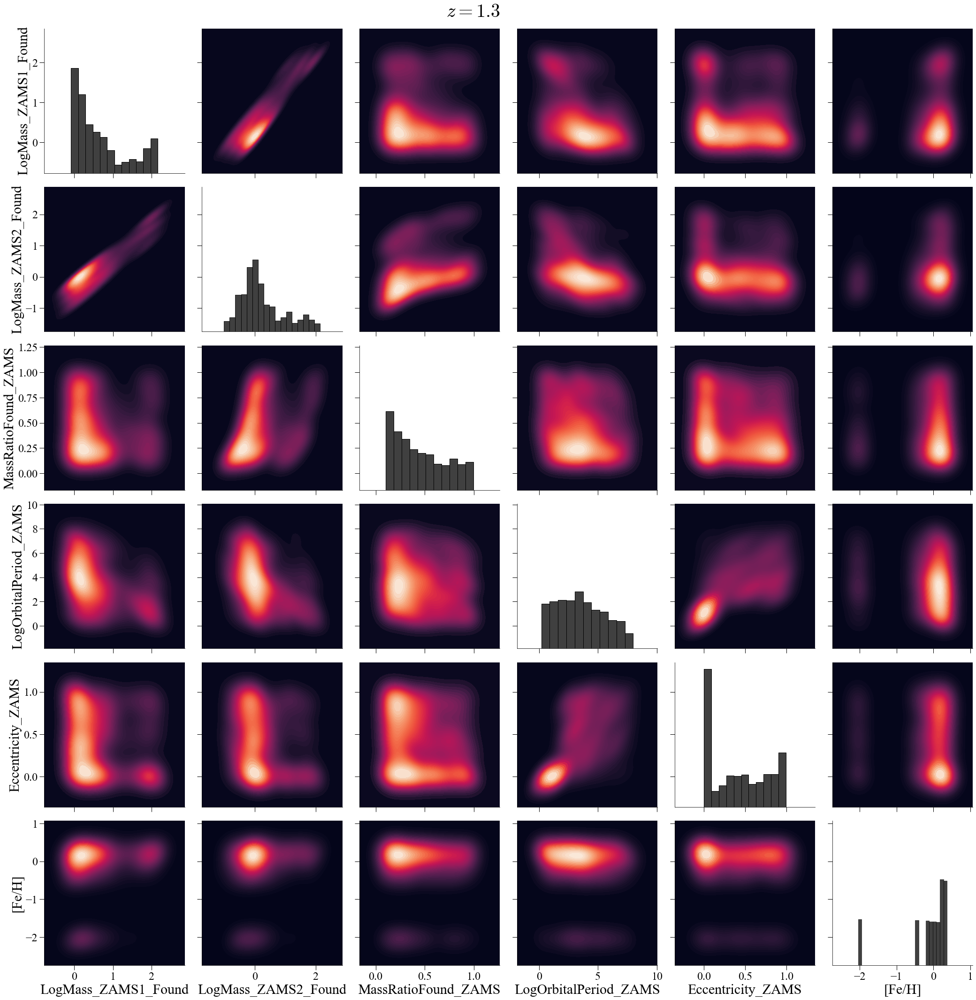

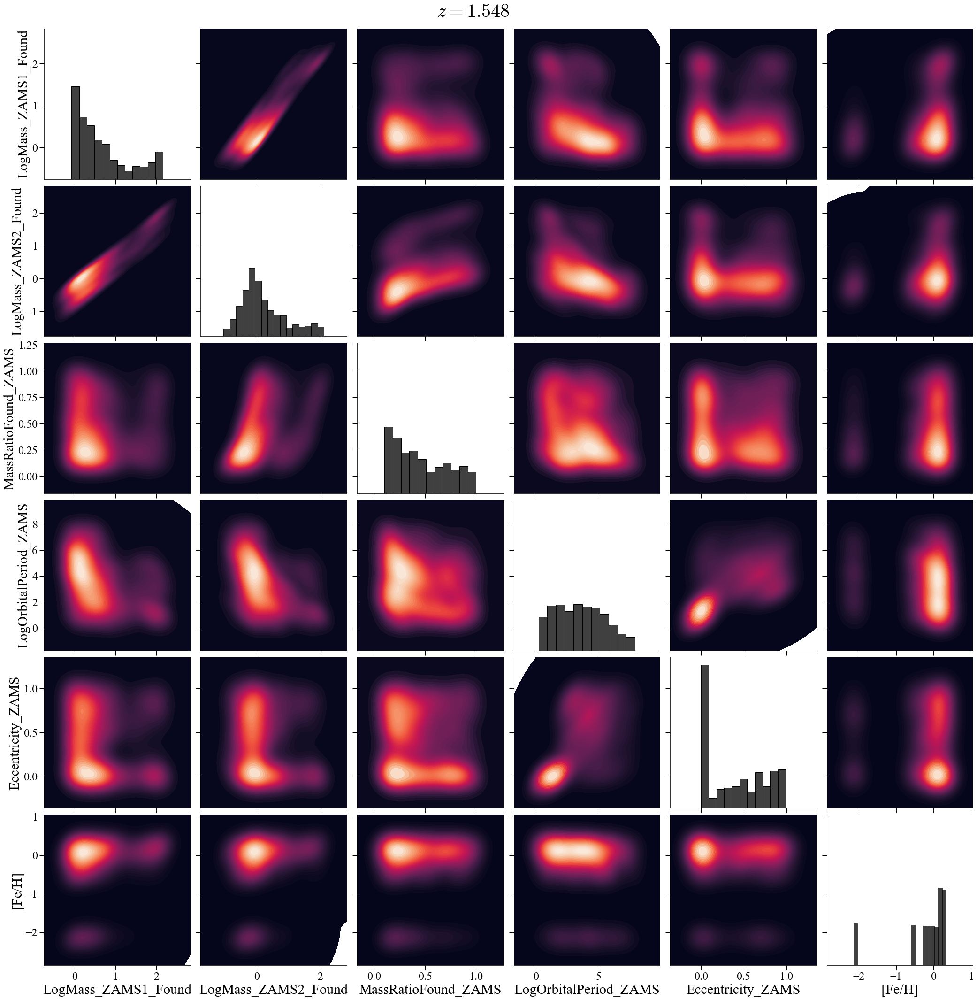

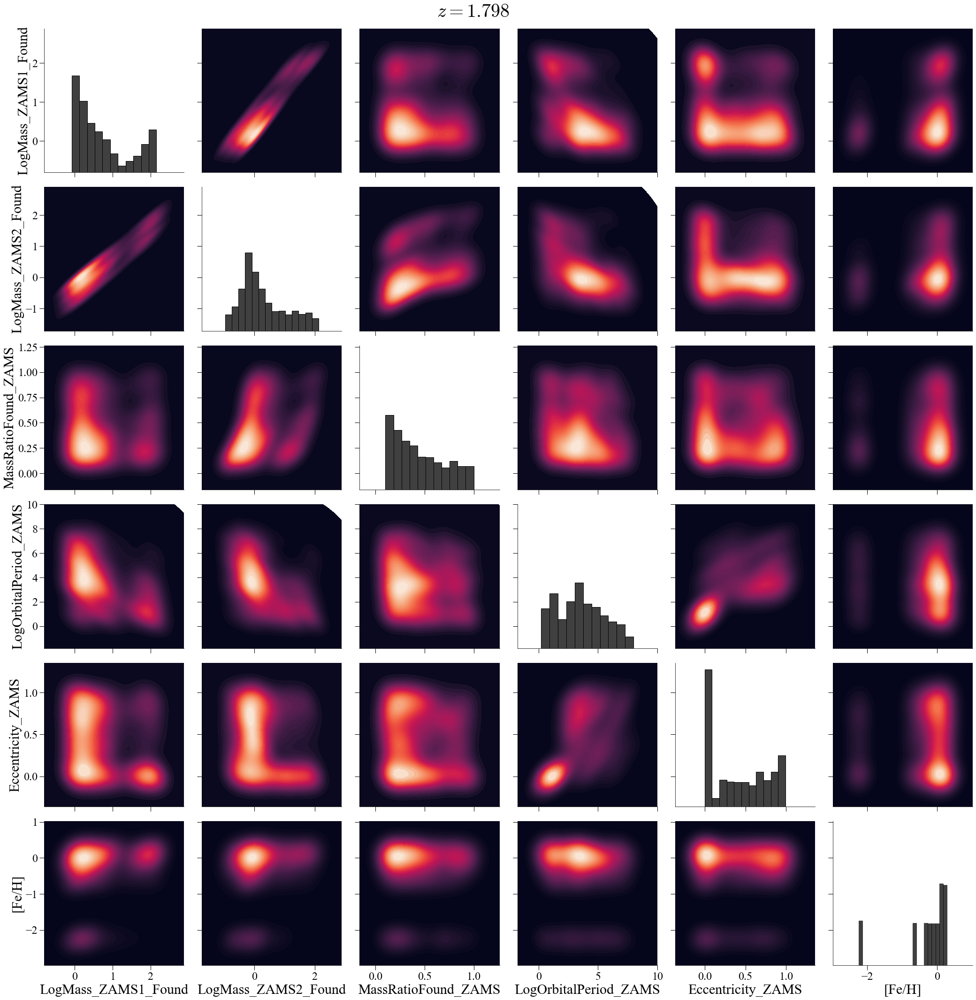

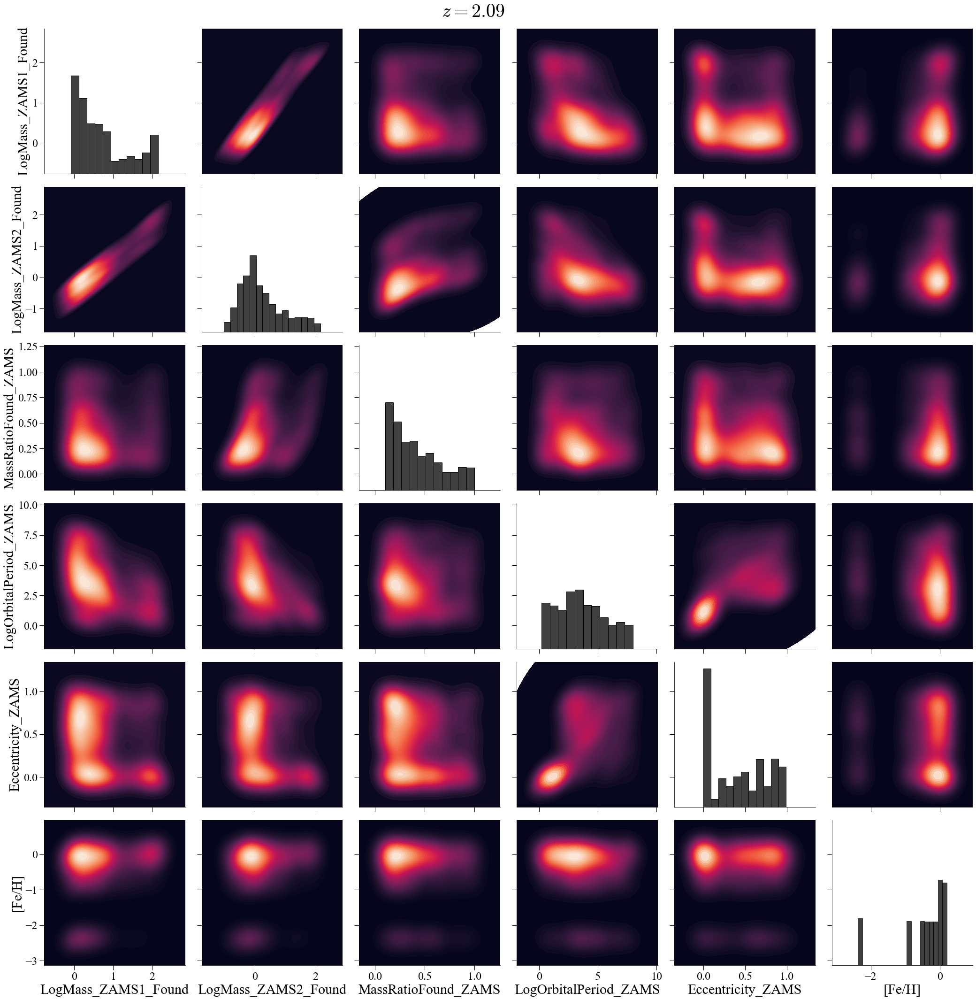

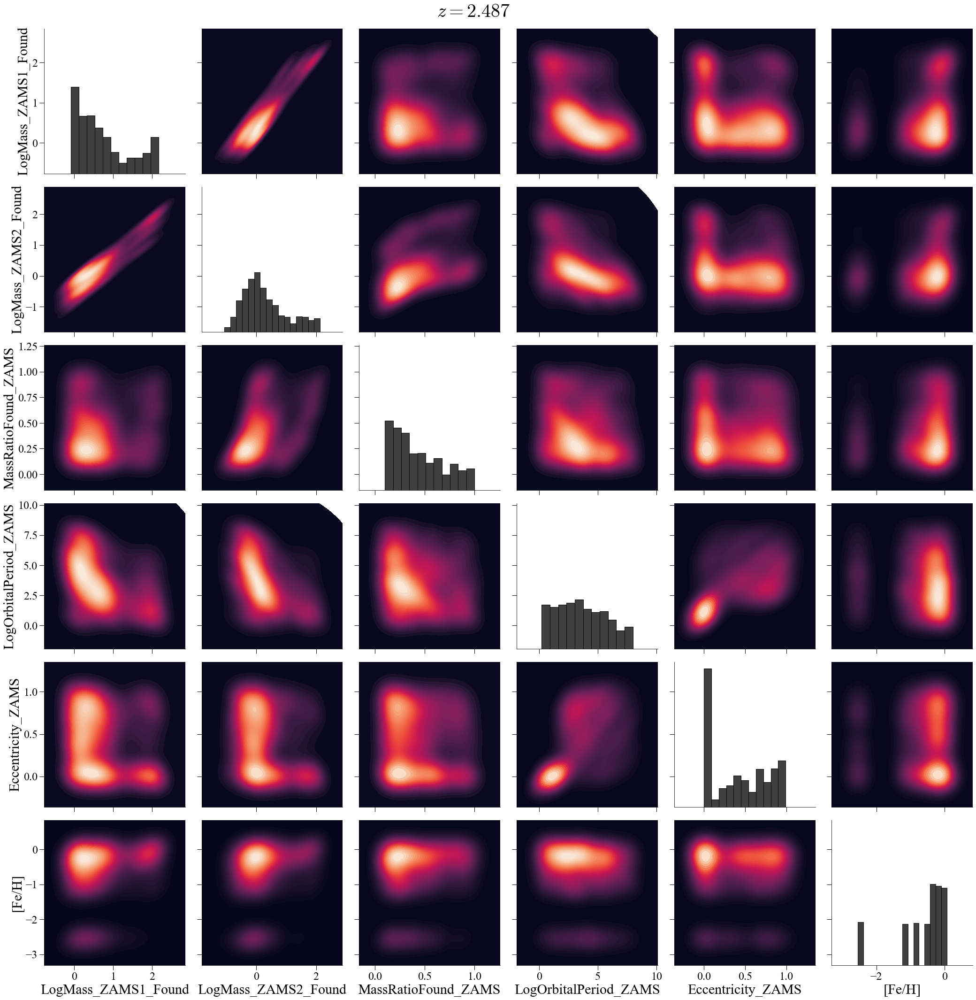

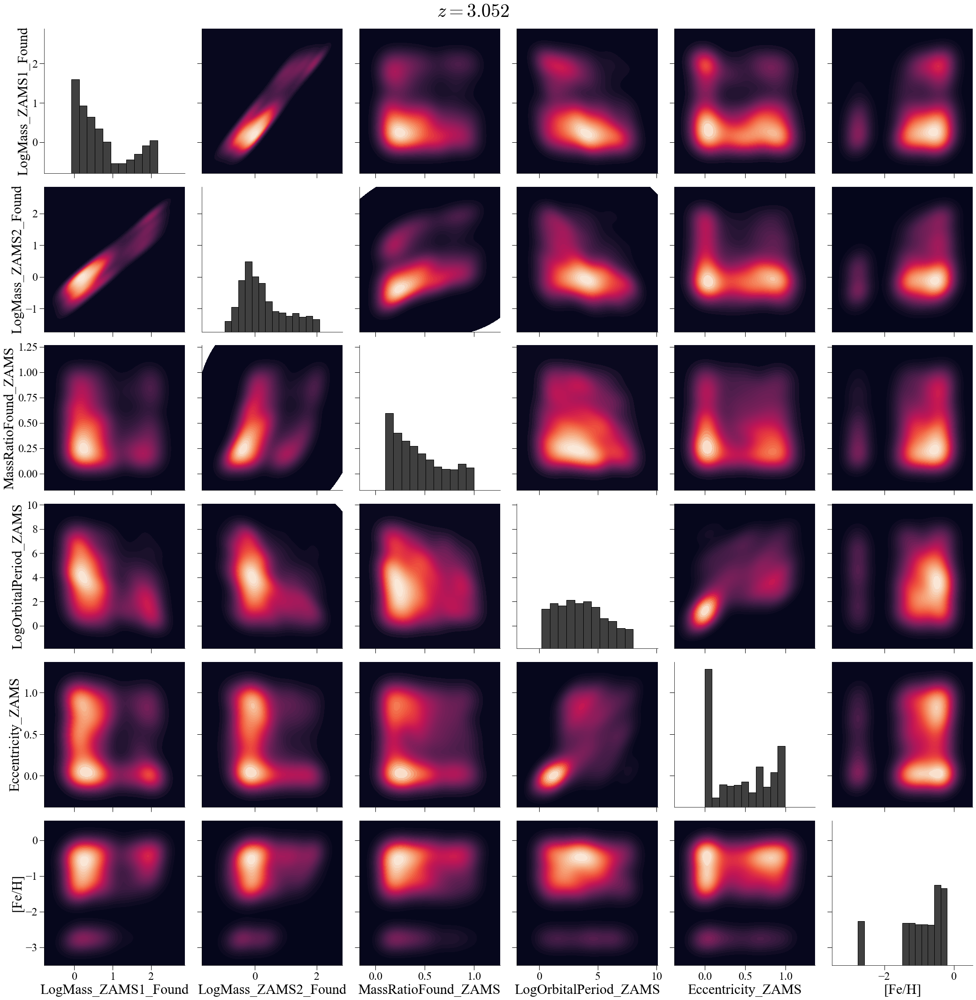

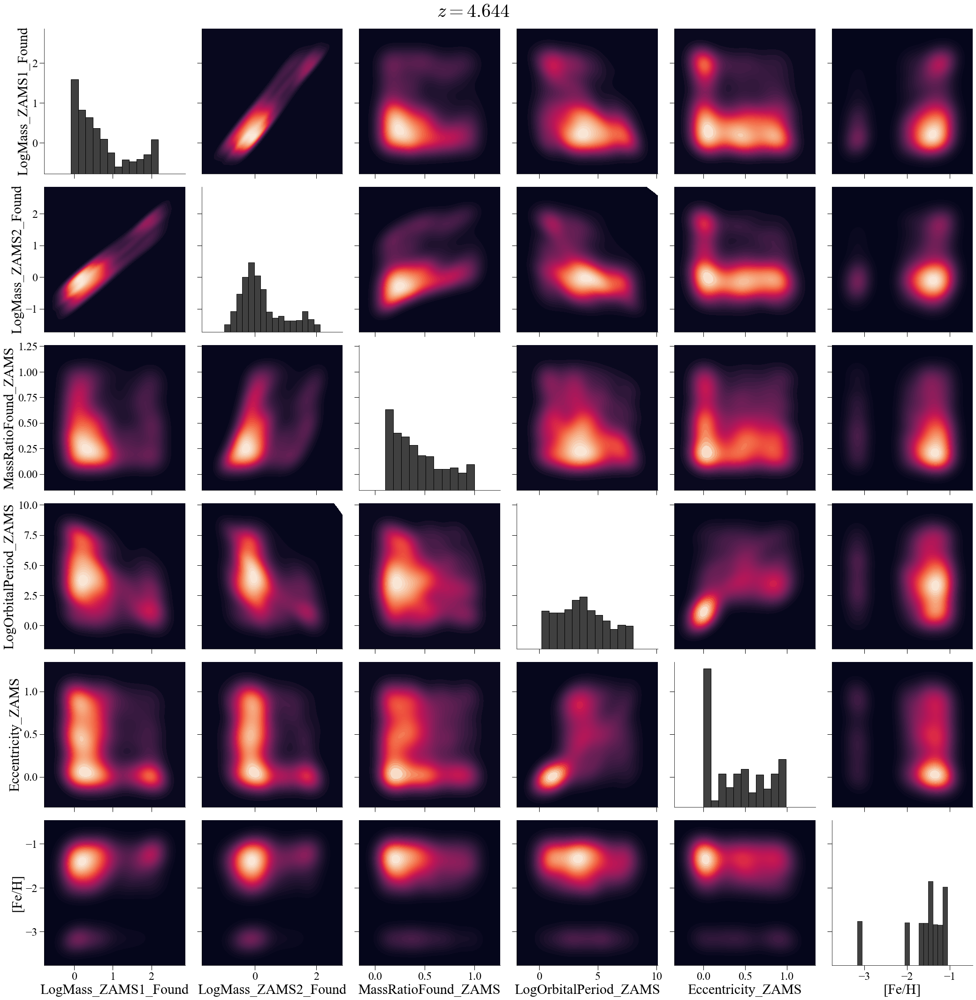

In [90]:
for i in range(len(zs)):
    side = len(heat_matrix_cols)
    z = zs[i]
    step = int(1e4)

    df = inner_binaries_df[inner_binaries_df['Redshift'] == z][::step]

    g = sns.PairGrid(df[heat_matrix_cols],
                    layout_pad=-0.1,
                    dropna=True)
    g.map_diag(sns.histplot, color='black')
    g.map_offdiag(sns.kdeplot, fill=True, cmap='rocket', thresh=0, levels=50)

    g.tight_layout()
    fig = g.figure
    fig.text(0.5, 1, f'$z={z}$', fontsize=40, ha='center', va='bottom')
    fig.set_size_inches(30, 30)
    rect = fig.patch
    rect.set_facecolor('white')
    
    g.savefig(FIGURE_FOLDER/f'inbin_ZAMS_heatmatrix_1e2z{100*z:.0f}.png', bbox_inches='tight')
    del df
    gc.collect()

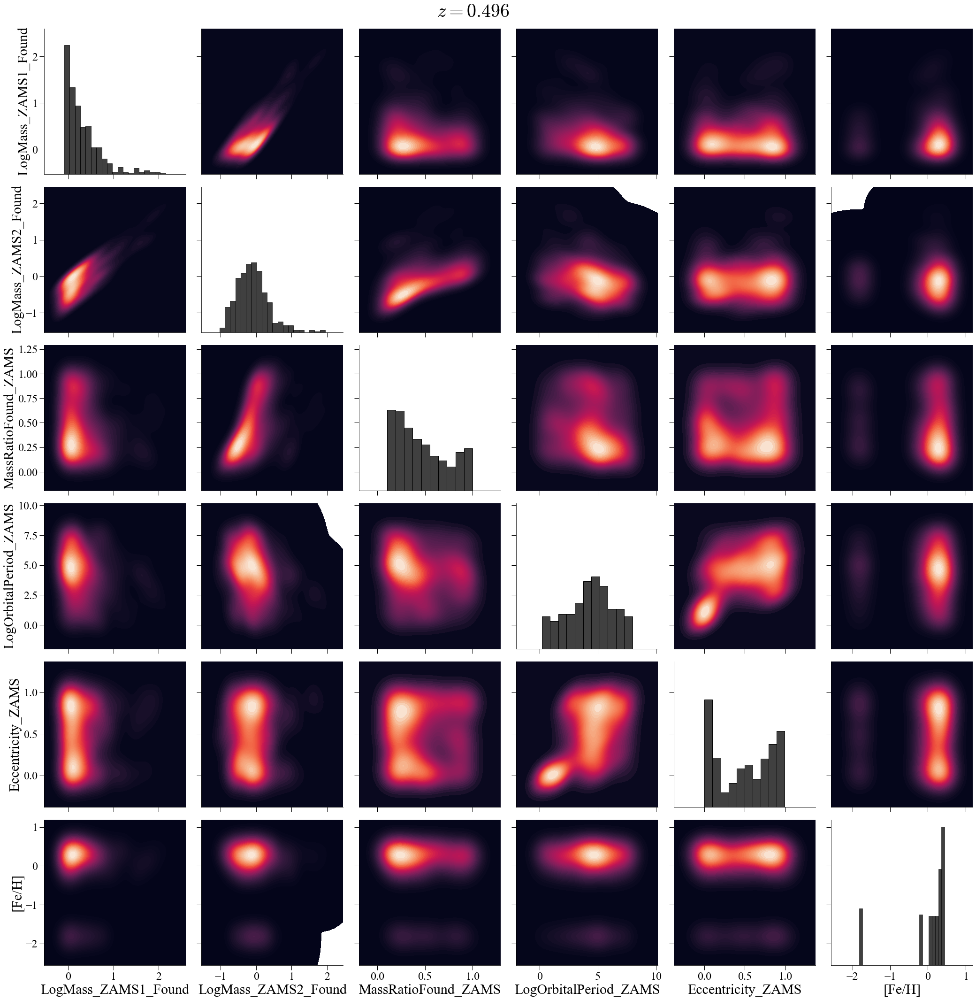

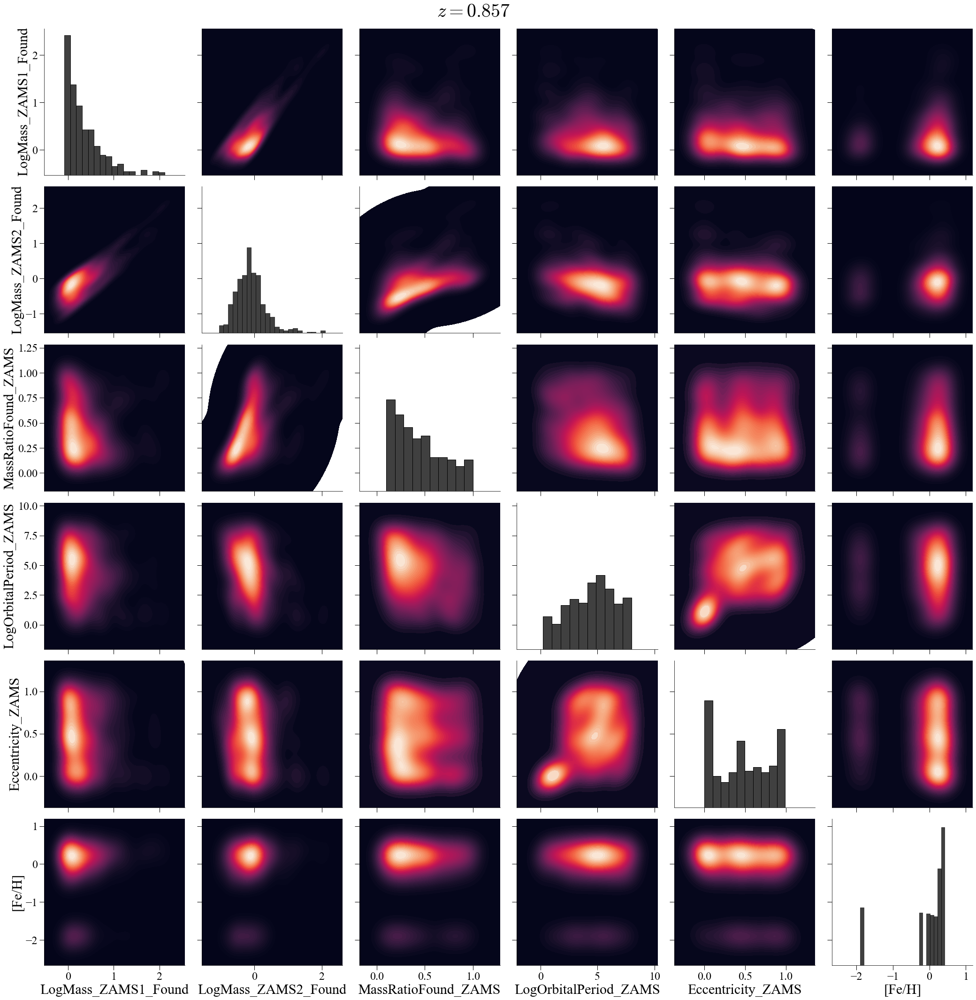

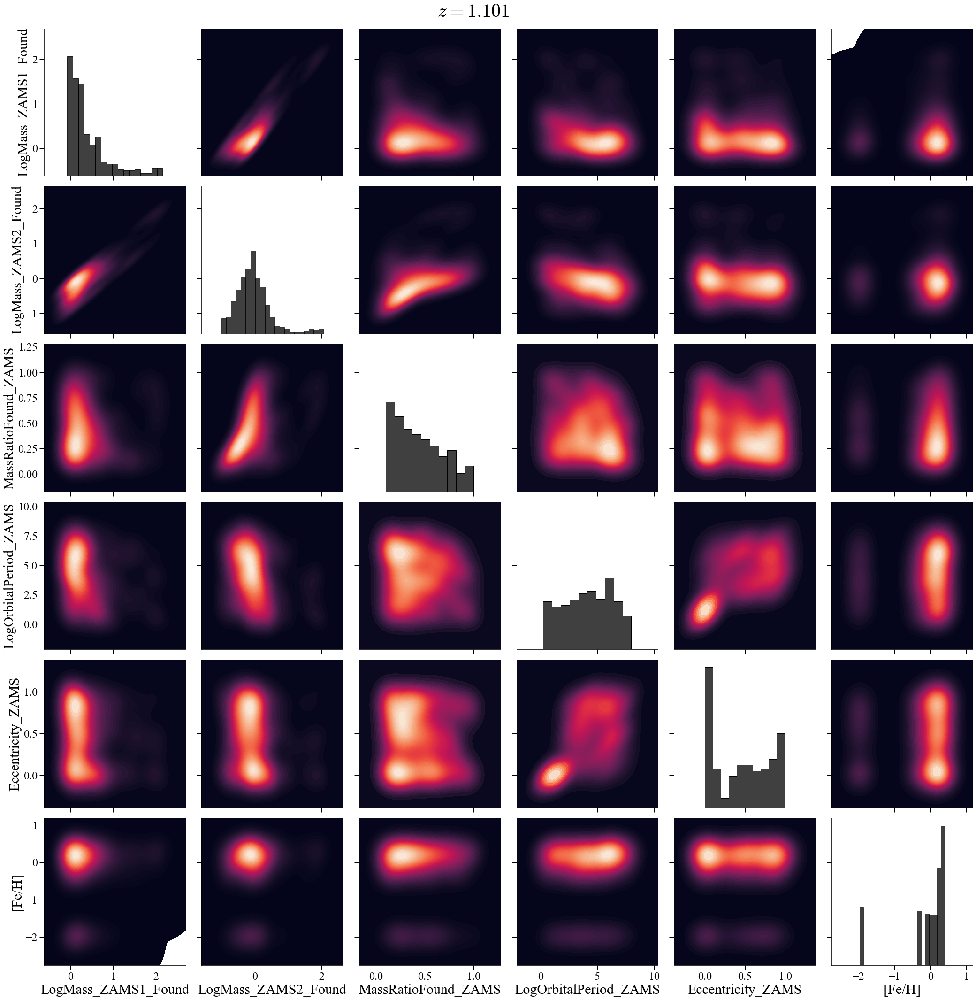

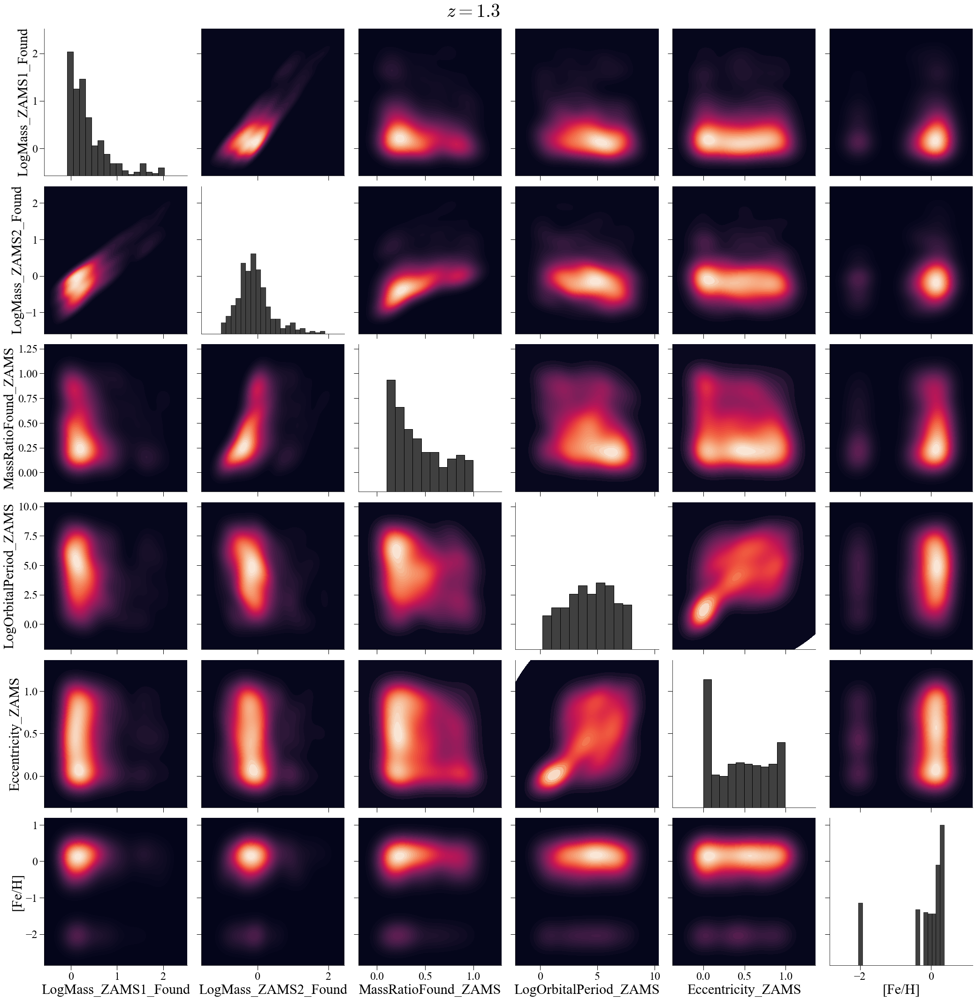

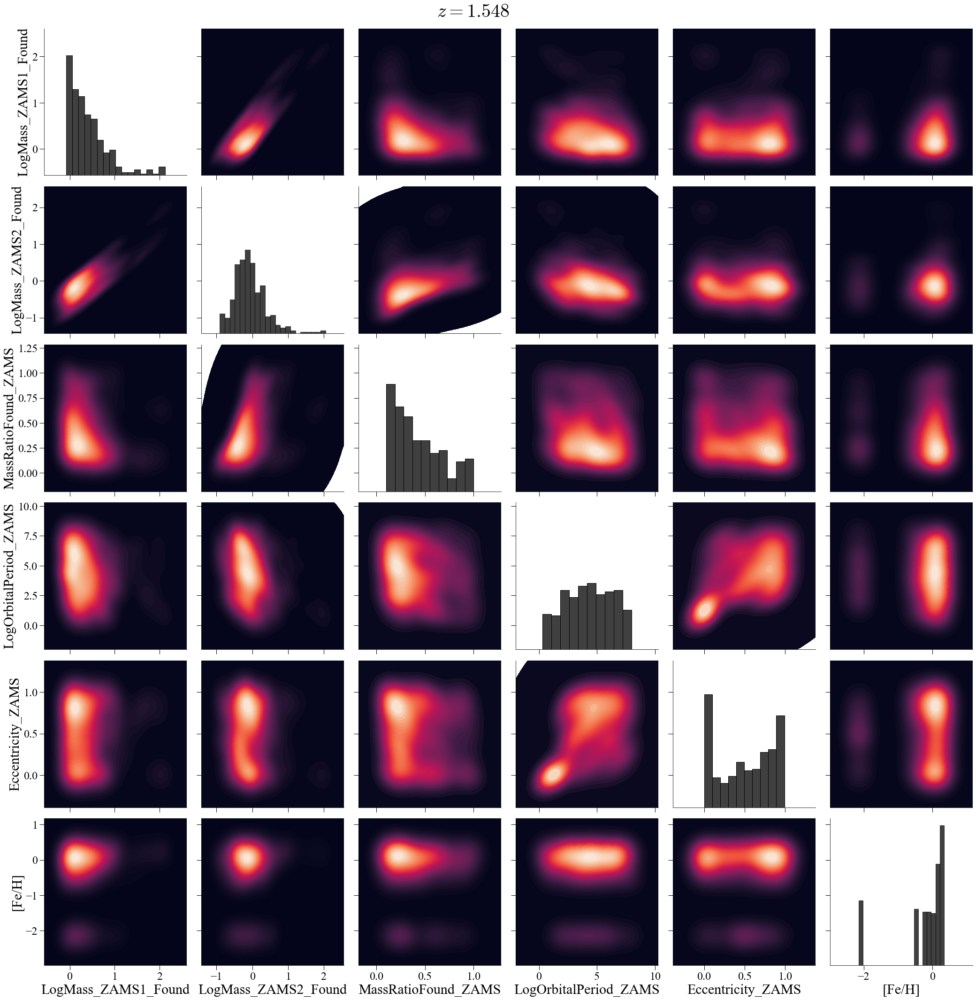

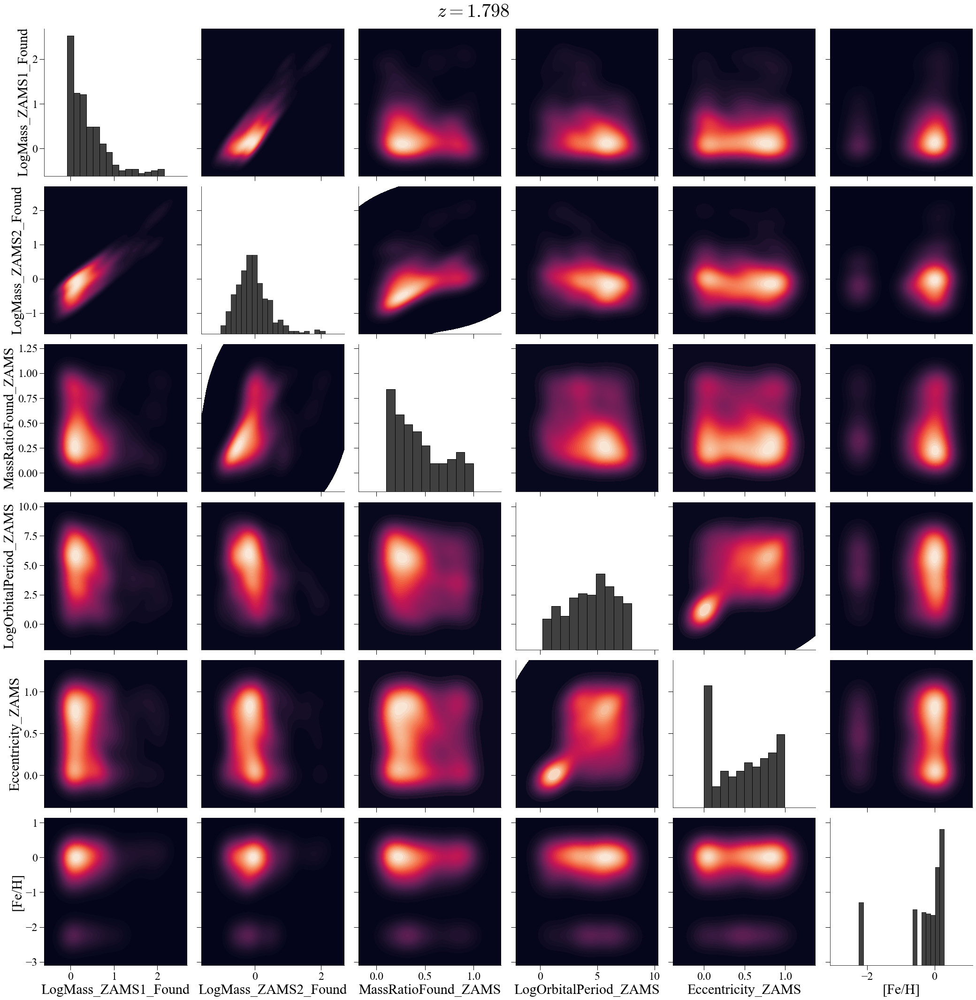

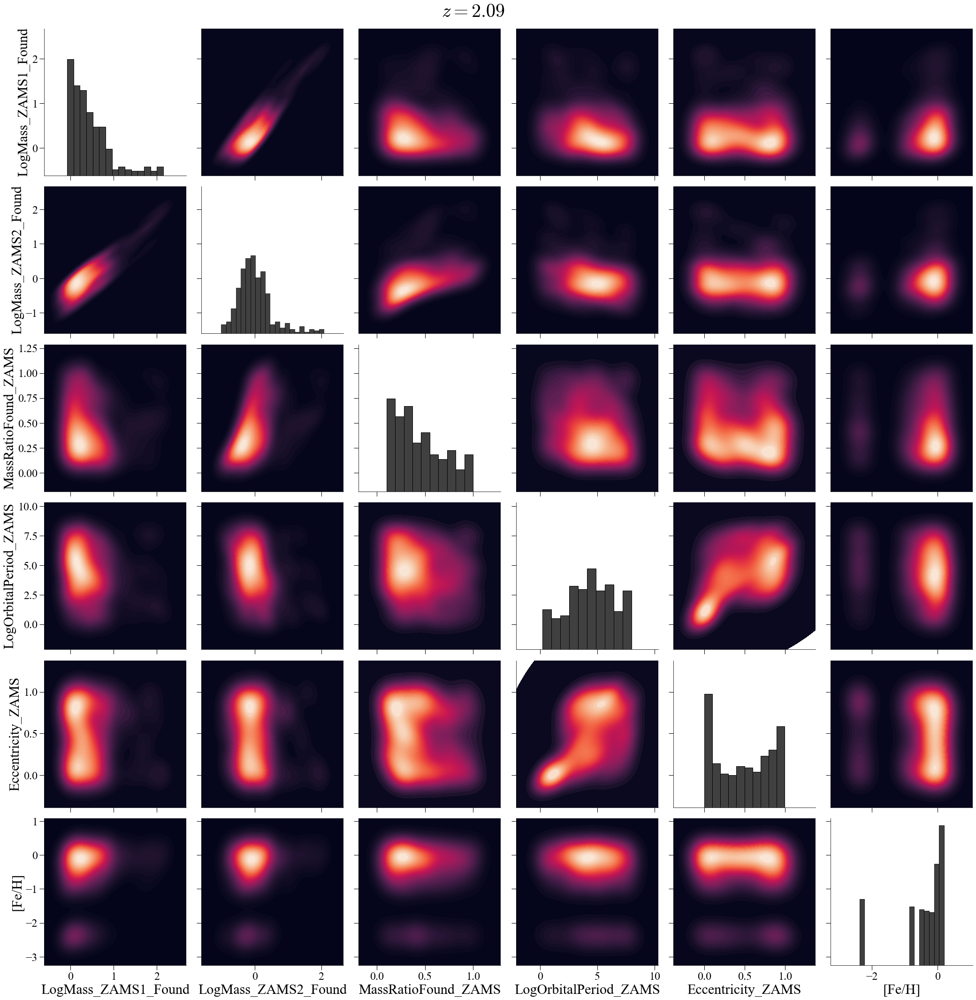

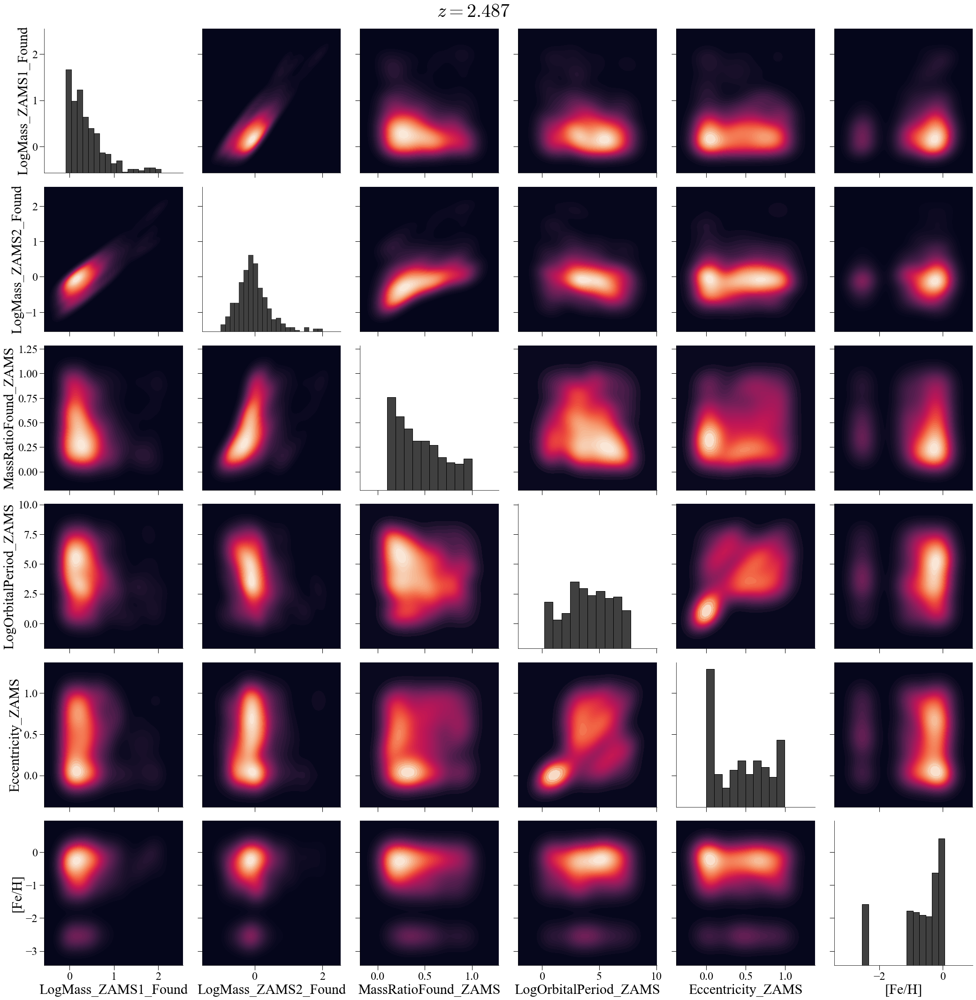

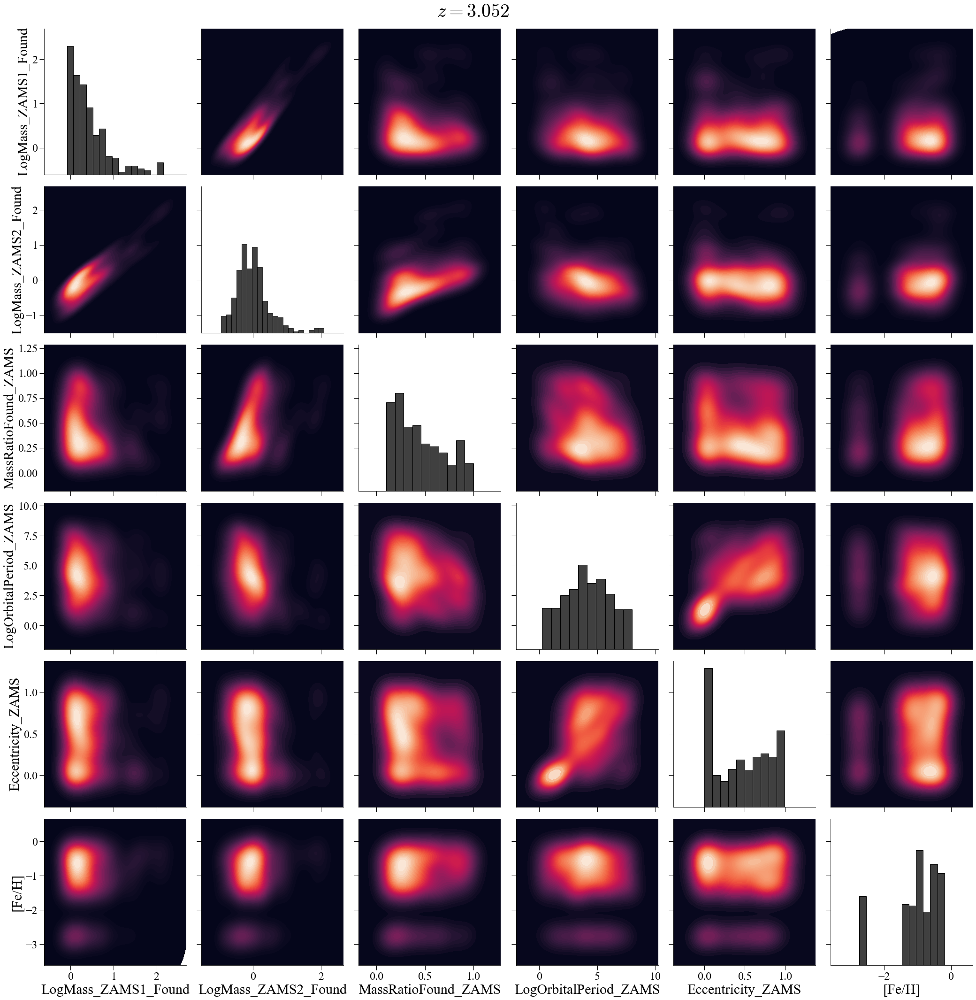

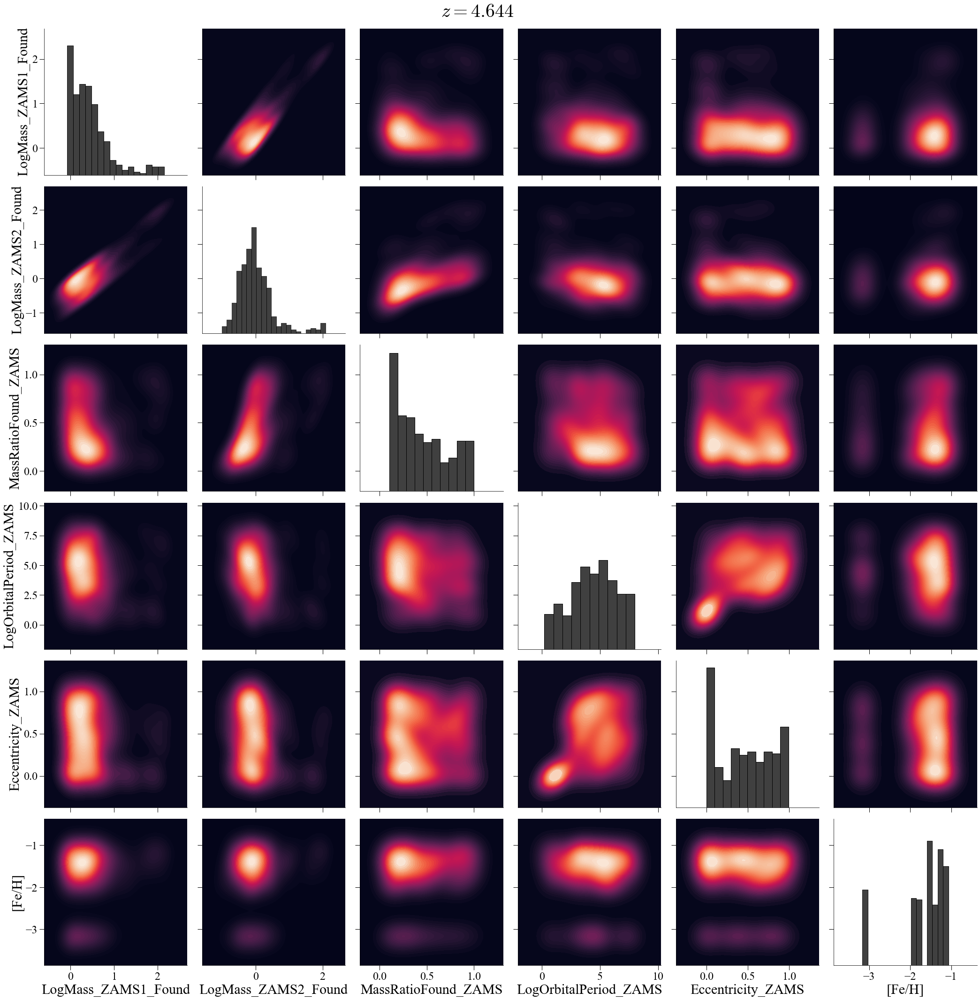

In [91]:
for i in range(len(zs)):
    side = len(heat_matrix_cols)
    z = zs[i]
    step = int(1e4)

    df = binaries_df[binaries_df['Redshift'] == z][::step]

    g = sns.PairGrid(df[heat_matrix_cols],
                    layout_pad=-0.1,
                    dropna=True)
    g.map_diag(sns.histplot, color='black')
    g.map_offdiag(sns.kdeplot, fill=True, cmap='rocket', thresh=0, levels=50)

    g.tight_layout()
    fig = g.figure
    fig.text(0.5, 1, f'$z={z}$', fontsize=40, ha='center', va='bottom')
    fig.set_size_inches(30, 30)
    rect = fig.patch
    rect.set_facecolor('white')
    
    g.savefig(FIGURE_FOLDER/f'bin_ZAMS_heatmatrix_1e2z{100*z:.0f}.png', bbox_inches='tight')
    del df
    gc.collect()